In [22]:
!pip install torch torchvision torchaudio

In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
import os
from PIL import Image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# Partie 1 : AE et VAE sur MNIST

## Question 1 : Établir une Architecture Auto-Encoder (AE) puis entraîner sur MNIST

In [24]:
# Transformations
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])  # Normalise à [-1,1]

# Chargement MNIST
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

In [25]:
class AutoEncoder(nn.Module):
    def __init__(self, latent_dim=32):
        super(AutoEncoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(28*28, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, latent_dim)
        )
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, 28*28),
            nn.Tanh()  # Pour output en [-1,1]
        )
    
    def forward(self, x):
        x = x.view(-1, 28*28)  # Flatten
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded.view(-1, 1, 28, 28)  # Reshape to image

model_ae = AutoEncoder(latent_dim=32).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model_ae.parameters(), lr=0.001)

Epoch [10/50], Loss: 0.0232
Epoch [20/50], Loss: 0.0230
Epoch [30/50], Loss: 0.0229
Epoch [40/50], Loss: 0.0228
Epoch [50/50], Loss: 0.0227


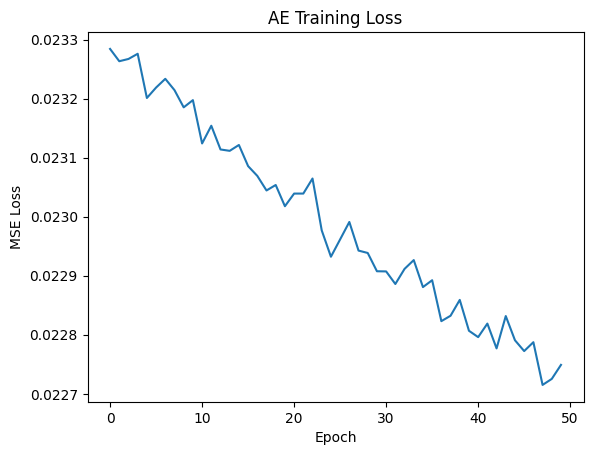

In [9]:
# num_epochs = 50
losses = []

for epoch in range(num_epochs):
    model_ae.train()
    train_loss = 0
    for data, _ in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        output = model_ae(data)
        loss = criterion(output, data)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    avg_loss = train_loss / len(train_loader)
    losses.append(avg_loss)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}')

# Plot Loss
plt.plot(losses)
plt.title('AE Training Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.show()

## Question 2 : Établir une Architecture Variational Auto-Encoder (VAE) puis entraîner sur MNIST

In [26]:
class VAE(nn.Module):
    def __init__(self, latent_dim=32):
        super(VAE, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(28*28, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(64, latent_dim)
        self.fc_logvar = nn.Linear(64, latent_dim)
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, 28*28),
            nn.Tanh()
        )
    
    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def decode(self, z):
        return self.decoder(z)
    
    def forward(self, x):
        x = x.view(-1, 28*28)
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z).view(-1, 1, 28, 28), mu, logvar

model_vae = VAE(latent_dim=32).to(device)
optimizer = optim.Adam(model_vae.parameters(), lr=0.001)

Epoch [10/50], Loss: 10343.1580, KL: 2628.1831
Epoch [20/50], Loss: 9644.1447, KL: 2741.8557
Epoch [30/50], Loss: 9280.6901, KL: 2832.5085
Epoch [40/50], Loss: 9086.0134, KL: 2864.1985
Epoch [50/50], Loss: 8964.2003, KL: 2879.5719


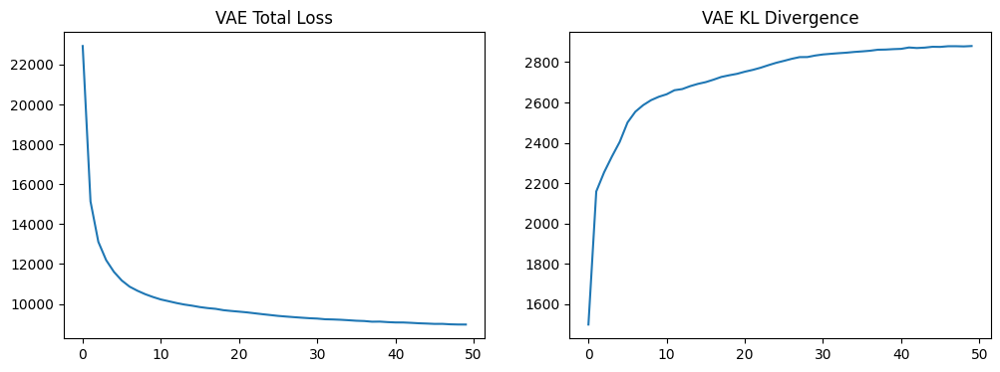

In [27]:
def vae_loss(recon_x, x, mu, logvar, beta=1.0):
    recon_loss = nn.functional.mse_loss(recon_x.view(-1, 28*28), x.view(-1, 28*28), reduction='sum')
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + beta * kl_loss

num_epochs = 50
vae_losses = []
kl_losses = []

for epoch in range(num_epochs):
    model_vae.train()
    train_loss = 0
    total_kl = 0
    for data, _ in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model_vae(data)
        loss = vae_loss(recon_batch, data, mu, logvar, beta=1.0)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        total_kl += (-0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())).item()
    
    avg_loss = train_loss / len(train_loader)
    avg_kl = total_kl / len(train_loader)
    vae_losses.append(avg_loss)
    kl_losses.append(avg_kl)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, KL: {avg_kl:.4f}')

# Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].plot(vae_losses)
ax[0].set_title('VAE Total Loss')
ax[1].plot(kl_losses)
ax[1].set_title('VAE KL Divergence')
plt.show()

## Question 3 : Évaluer les deux modèles en plottant (Loss, KL divergence, etc.)

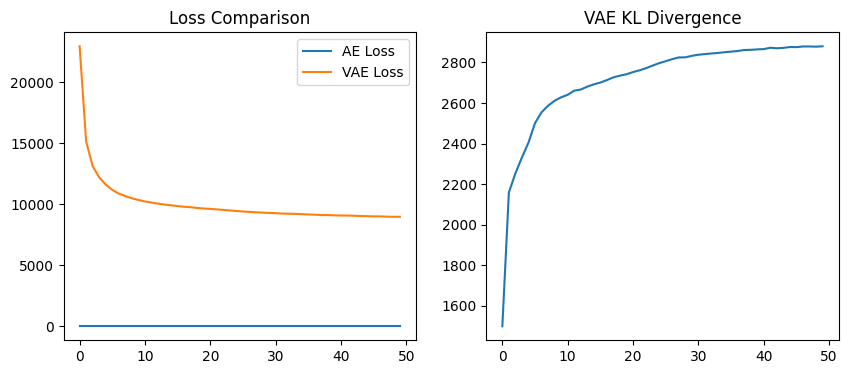

Test MSE AE: 0.9268
Test MSE VAE: 0.0603


In [28]:
# Loss comparatif
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(losses, label='AE Loss')
plt.plot(vae_losses, label='VAE Loss')
plt.title('Loss Comparison')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(kl_losses)
plt.title('VAE KL Divergence')
plt.show()

# MSE sur test
model_ae.eval()
model_vae.eval()
test_mse_ae = 0
test_mse_vae = 0
with torch.no_grad():
    for data, _ in test_loader:
        data = data.to(device)
        # AE
        recon_ae = model_ae(data)
        test_mse_ae += criterion(recon_ae, data).item()
        # VAE
        recon_vae, _, _ = model_vae(data)
        test_mse_vae += nn.MSELoss()(recon_vae, data).item()

print(f'Test MSE AE: {test_mse_ae / len(test_loader):.4f}')
print(f'Test MSE VAE: {test_mse_vae / len(test_loader):.4f}')

## Question 4 : Essayer de plotter le latent space des deux modèles

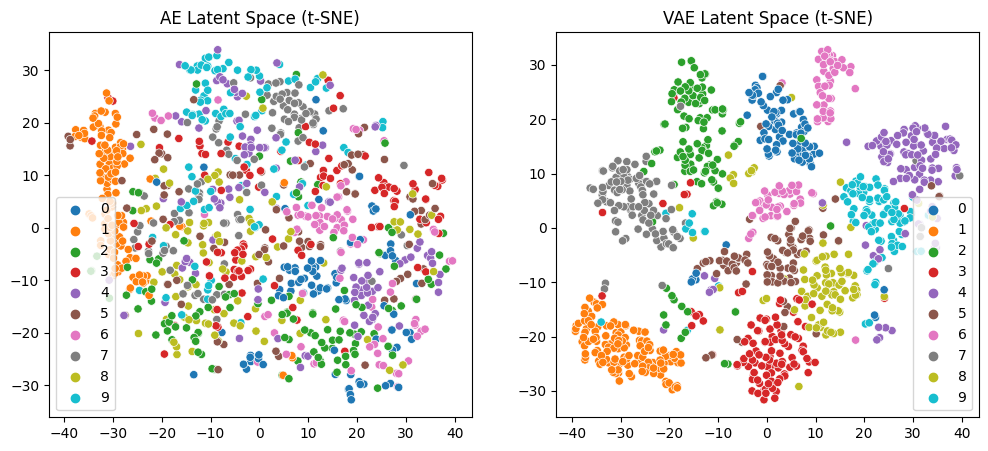

In [29]:
from sklearn.manifold import TSNE
import seaborn as sns  # !pip install seaborn si besoin

# Fonction pour extraire latents
def get_latents(model, loader, is_vae=False):
    latents = []
    labels = []
    model.eval()
    with torch.no_grad():
        for data, target in loader:
            data = data.to(device)
            if is_vae:
                mu, _ = model.encode(data.view(-1, 28*28))
                latents.append(mu.cpu().numpy())
            else:
                latent = model.encoder(data.view(-1, 28*28)).cpu().numpy()
                latents.append(latent)
            labels.append(target.numpy())
    return np.vstack(latents), np.hstack(labels)

# AE latents
ae_latents, ae_labels = get_latents(model_ae, test_loader, is_vae=False)

# VAE latents (μ)
vae_latents, vae_labels = get_latents(model_vae, test_loader, is_vae=True)

# t-SNE
tsne_ae = TSNE(n_components=2).fit_transform(ae_latents[:1000])  # Subsample pour vitesse
tsne_vae = TSNE(n_components=2).fit_transform(vae_latents[:1000])

# Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
sns.scatterplot(x=tsne_ae[:,0], y=tsne_ae[:,1], hue=ae_labels[:1000], ax=ax[0], palette='tab10')
ax[0].set_title('AE Latent Space (t-SNE)')
sns.scatterplot(x=tsne_vae[:,0], y=tsne_vae[:,1], hue=vae_labels[:1000], ax=ax[1], palette='tab10')
ax[1].set_title('VAE Latent Space (t-SNE)')
plt.show()

# Partie 2 : GANs sur Abstract Art Gallery

In [47]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print(f"Dataset path: {os.listdir('/kaggle/input/abstract-art-gallery')}")  # Vérifie le dossier

Using device: cuda
Dataset path: ['__results__.html', '__notebook__.ipynb', '__results___files', '__output__.json', 'custom.css']


## Question 1 : Utilisant PyTorch Library : Définir Generator, Définir Discriminator, Définir Loss Function, Initialiser Generator et Discriminator, GPU Setting, Configurer Data Loader, Définir Optimizers et Faire l'Entraînement

In [50]:
# Transformations : Resize à 64x64, normalise à [-1,1] pour Tanh
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # RGB
])

# Dataset : ImageFolder sur dossier unique (1 classe)
dataset_path = '/kaggle/input/abstract-art-gallery'
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2)  # num_workers pour vitesse

print(f"Nombre d'images: {len(dataset)}")  # Devrait être ~2782
print(f"Exemple de chemin: {dataset.samples[0][0]}")  # Vérifie

Nombre d'images: 3
Exemple de chemin: /kaggle/input/abstract-art-gallery/__results___files/__results___27_0.png


In [51]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Bruit -> couche linéaire + reshape
            nn.Linear(latent_dim, 256 * 4 * 4),  # 256 channels, 4x4
            nn.ReLU(True),
            nn.Unflatten(1, (256, 4, 4)),  # Reshape en feature map
            
            # Deconv layers (upscaling)
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # -> 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   # -> 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),    # -> 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),     # -> 64x64
            nn.Tanh()  # Output [-1,1]
        )
    
    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Conv layers (downscaling)
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),  # -> 32x32
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # -> 16x16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # -> 8x8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # -> 4x4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Flatten et output scalaire
            nn.Flatten(),
            nn.Linear(512 * 4 * 4, 1),
            nn.Sigmoid()  # Probabilité
        )
    
    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)

# Initialisation
latent_dim = 100
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)

# Poids init (optionnel pour stabilité)
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

generator.apply(weights_init)
discriminator.apply(weights_init)

print(f"Generator params: {sum(p.numel() for p in generator.parameters())}")
print(f"Discriminator params: {sum(p.numel() for p in discriminator.parameters())}")

Generator params: 1104035
Discriminator params: 2766529


Epoch [10/100] - G Loss: 18.4937, D Loss: 0.0015


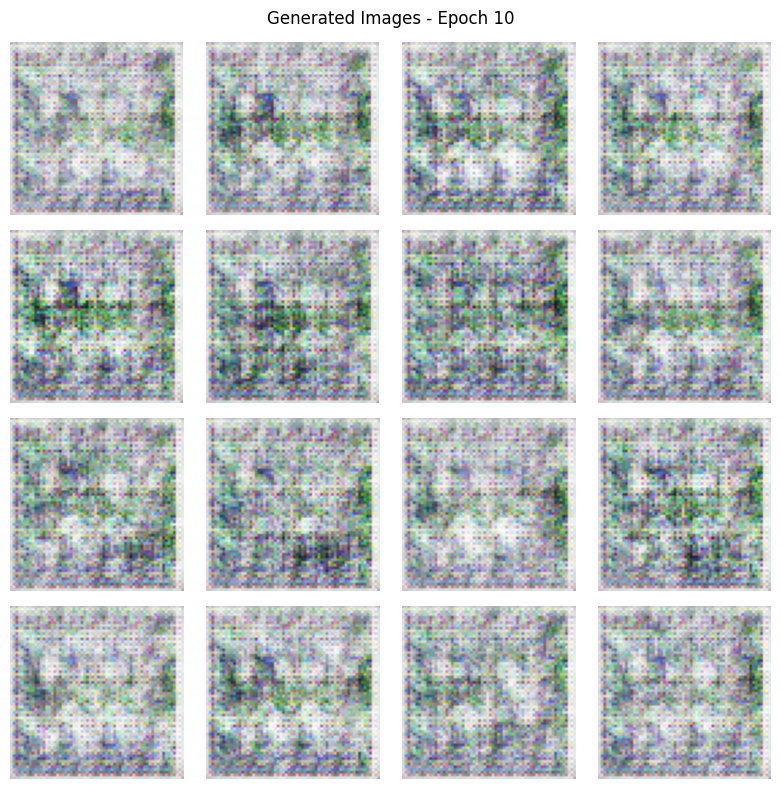

Epoch [20/100] - G Loss: 10.8820, D Loss: 0.0001


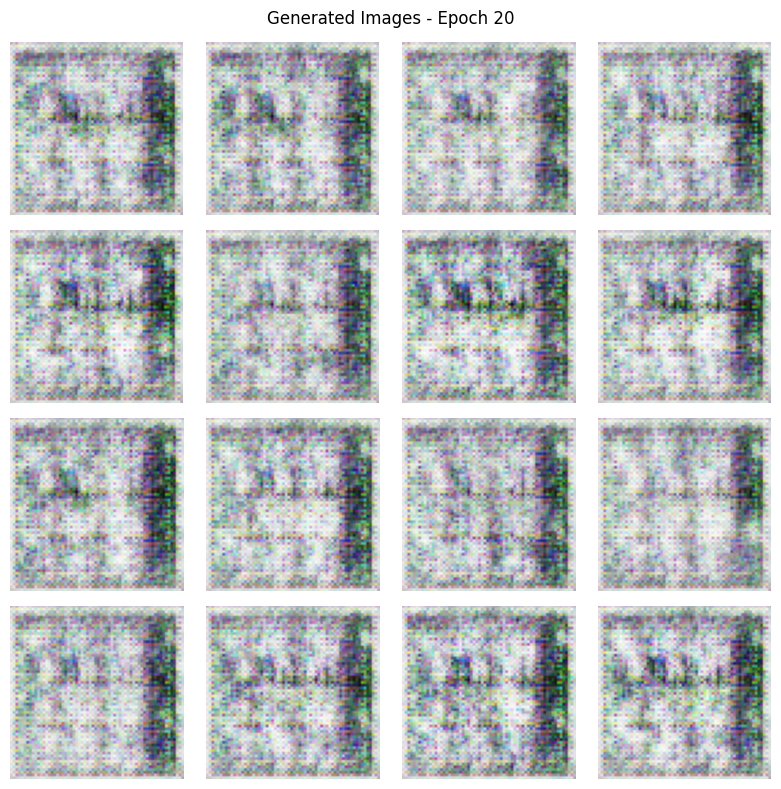

Epoch [30/100] - G Loss: 11.0552, D Loss: 0.0001


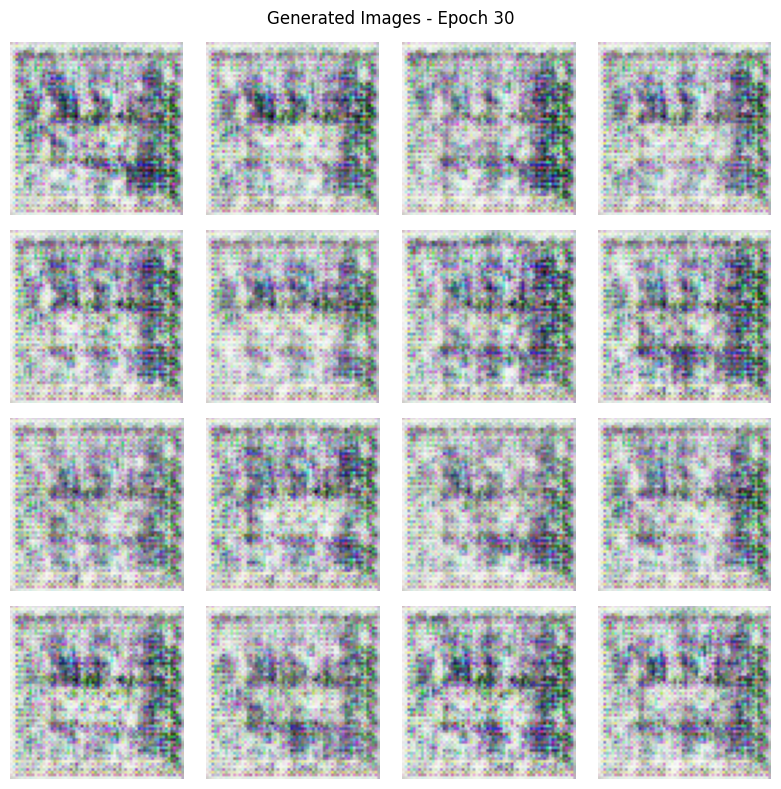

Epoch [40/100] - G Loss: 14.0139, D Loss: 0.0000


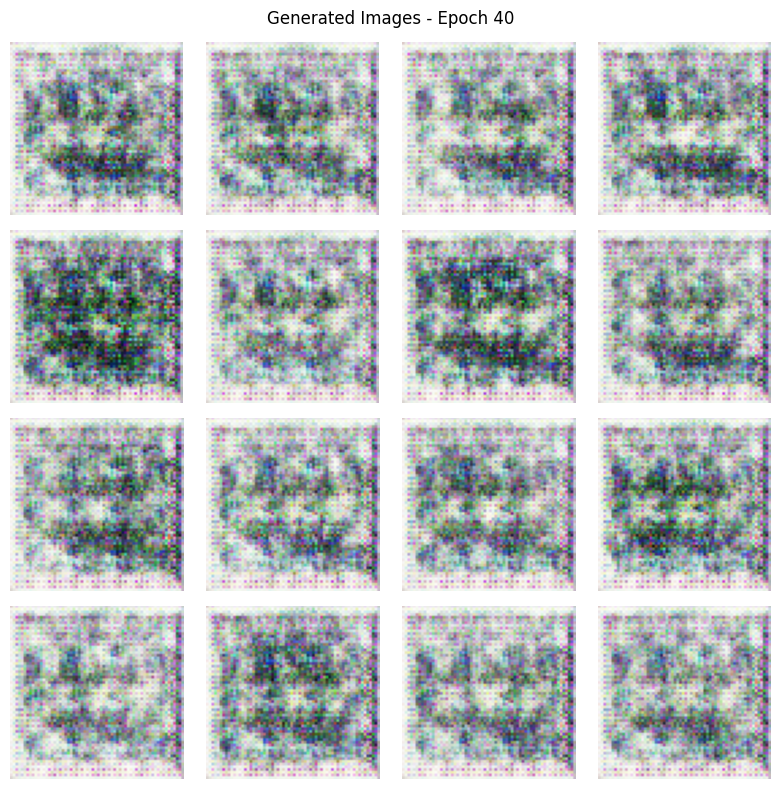

Epoch [50/100] - G Loss: 11.1785, D Loss: 0.0000


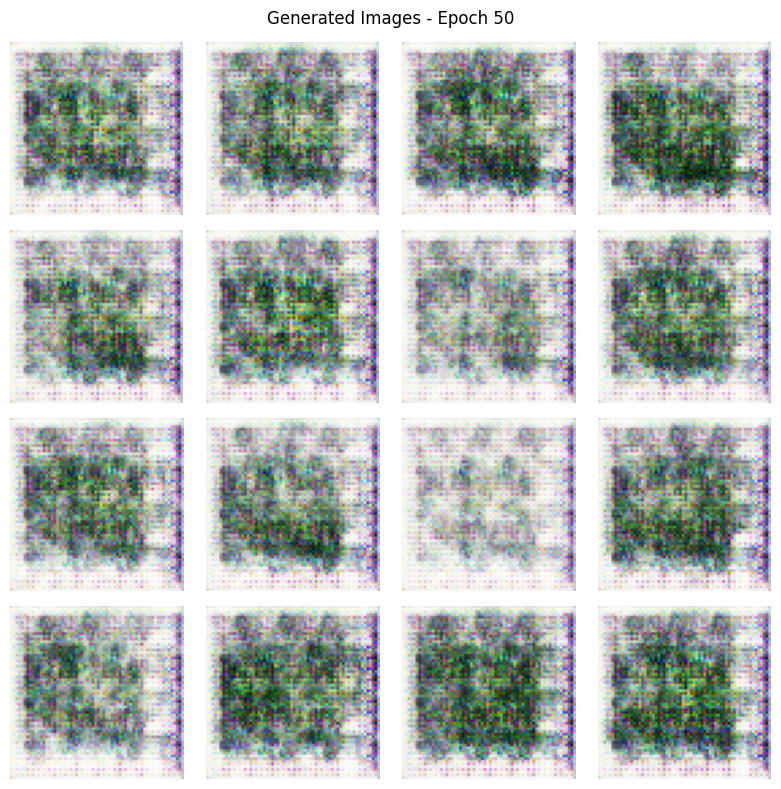

Epoch [60/100] - G Loss: 11.4397, D Loss: 0.0001


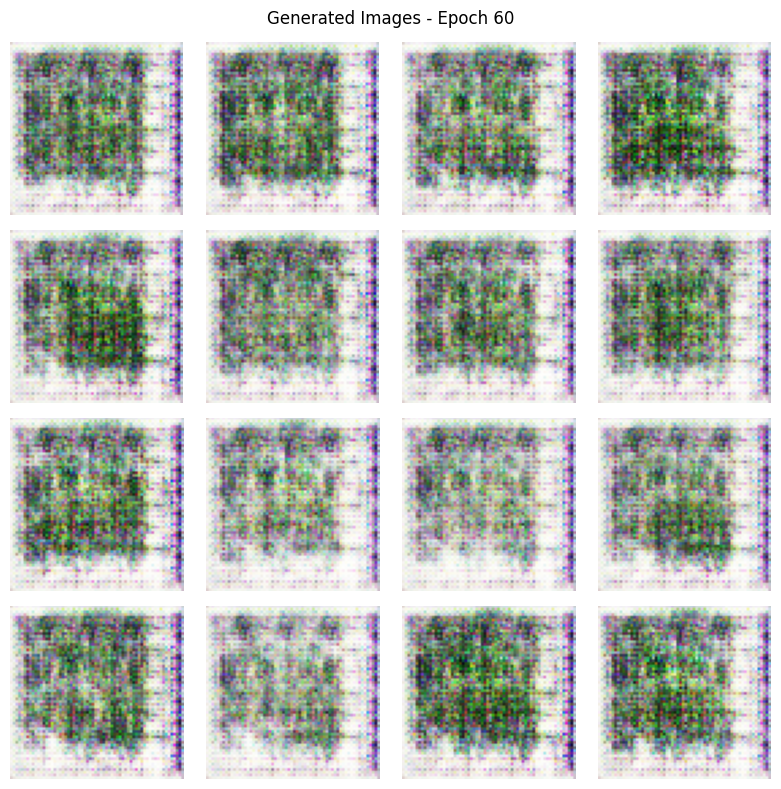

Epoch [70/100] - G Loss: 12.4664, D Loss: 0.0001


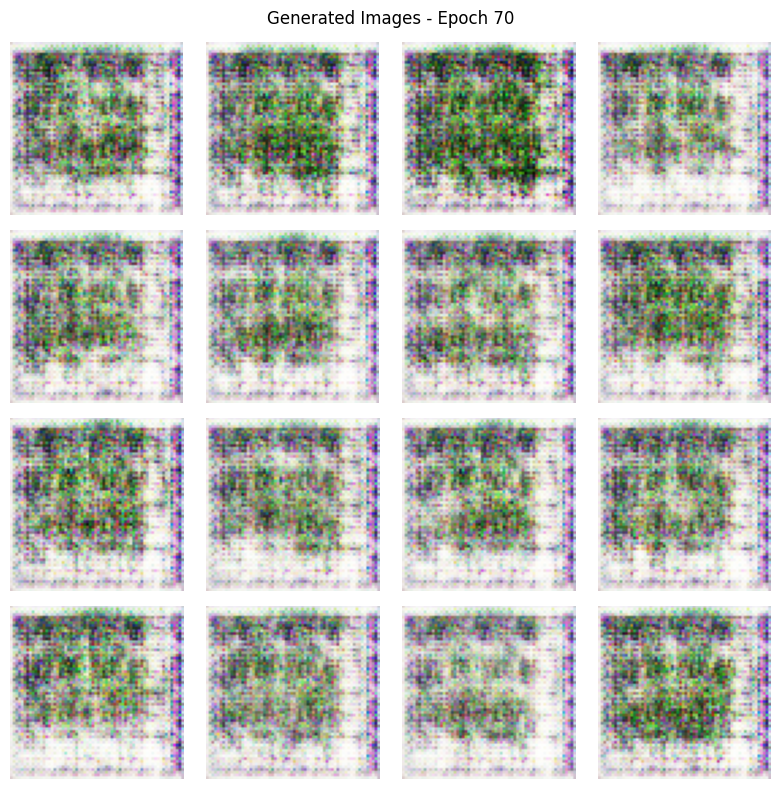

Epoch [80/100] - G Loss: 7.1584, D Loss: 0.0006


In [ ]:
# Loss et Optimizers
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Fonction pour plotter images générées (monitor)
def plot_generated_images(n_images=16, epoch=0, save=False):
    with torch.no_grad():
        noise = torch.randn(n_images, latent_dim, device=device)
        fake = generator(noise).cpu()
        # Denormalize pour plot
        fake = (fake * 0.5 + 0.5).clamp(0, 1)
    
    fig, axs = plt.subplots(4, 4, figsize=(8, 8))
    for i, ax in enumerate(axs.flat):
        ax.imshow(fake[i].permute(1, 2, 0))
        ax.axis('off')
    plt.suptitle(f'Generated Images - Epoch {epoch}')
    plt.tight_layout()
    if save:
        plt.savefig(f'generated_epoch_{epoch}.png')
    plt.show()

# Entraînement
num_epochs = 100
fixed_noise = torch.randn(16, latent_dim, device=device)  # Pour monitor fixe
g_losses, d_losses = [], []

for epoch in range(num_epochs):
    for batch_idx, (real_imgs, _) in enumerate(dataloader):
        batch_size = real_imgs.size(0)
        real_imgs = real_imgs.to(device)
        
        # Labels
        real_labels = torch.ones(batch_size, device=device)
        fake_labels = torch.zeros(batch_size, device=device)
        
        # --- Entraîner Discriminator ---
        optimizer_D.zero_grad()
        real_output = discriminator(real_imgs)
        d_real_loss = criterion(real_output, real_labels)
        d_real_loss.backward()  # Backprop partiel pour stabilité
        
        # Générer faux
        noise = torch.randn(batch_size, latent_dim, device=device)
        fake_imgs = generator(noise)
        fake_output = discriminator(fake_imgs.detach())  # Detach pour ne pas updater G
        d_fake_loss = criterion(fake_output, fake_labels)
        d_fake_loss.backward()
        
        d_loss = d_real_loss + d_fake_loss
        optimizer_D.step()
        
        # --- Entraîner Generator ---
        optimizer_G.zero_grad()
        fake_output = discriminator(fake_imgs)  # Réutilise, mais sans detach
        g_loss = criterion(fake_output, real_labels)  # G veut tromper D (label=1)
        g_loss.backward()
        optimizer_G.step()
        
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
    
    # Logs
    avg_g_loss = np.mean(g_losses[-len(dataloader):])
    avg_d_loss = np.mean(d_losses[-len(dataloader):])
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}] - G Loss: {avg_g_loss:.4f}, D Loss: {avg_d_loss:.4f}')
        plot_generated_images(epoch=epoch+1)  # Monitor visuel
    
    # Sauvegarde modèle
    if (epoch + 1) % 50 == 0:
        torch.save(generator.state_dict(), f'generator_epoch_{epoch+1}.pth')

# Plot losses finales
plt.figure(figsize=(10, 4))
plt.plot(g_losses, label='Generator Loss')
plt.plot(d_losses, label='Discriminator Loss')
plt.title('GAN Training Losses')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Question 2 : Évaluer le modèle en plottant (Loss, KL divergence, etc.)

Discriminator on fakes: mean=0.2961 (idéal ~0.5)


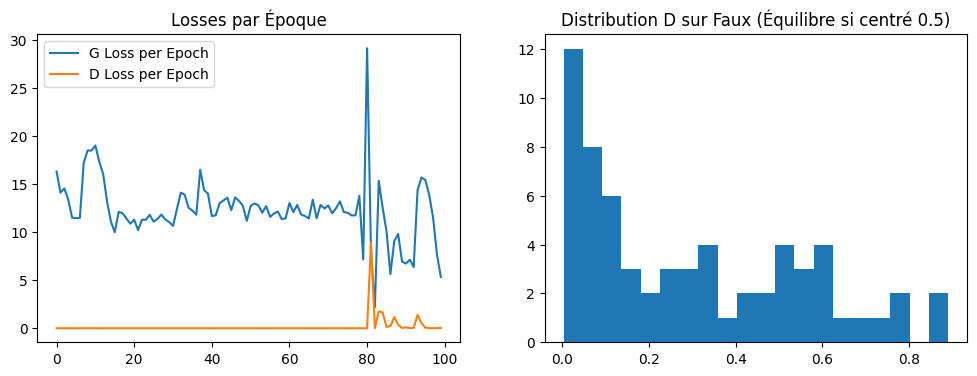

In [56]:
# Éval finale : Prob D sur faux
with torch.no_grad():
    noise = torch.randn(64, latent_dim, device=device)
    fake = generator(noise)
    fake_pred = discriminator(fake)
    print(f'Discriminator on fakes: mean={fake_pred.mean().item():.4f} (idéal ~0.5)')

# Plot losses détaillé (par époque)
g_epoch = [np.mean(g_losses[i*len(dataloader):(i+1)*len(dataloader)]) for i in range(num_epochs)]
d_epoch = [np.mean(d_losses[i*len(dataloader):(i+1)*len(dataloader)]) for i in range(num_epochs)]

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(g_epoch, label='G Loss per Epoch')
plt.plot(d_epoch, label='D Loss per Epoch')
plt.title('Losses par Époque')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(fake_pred.cpu().numpy(), bins=20)
plt.title('Distribution D sur Faux (Équilibre si centré 0.5)')
plt.show()

## Question 3 : Générer les Nouvelles Données et Comparer leur Qualité aux Originales

Taille batch réel: torch.Size([3, 3, 64, 64])
Nombre d'images à plotter: 3


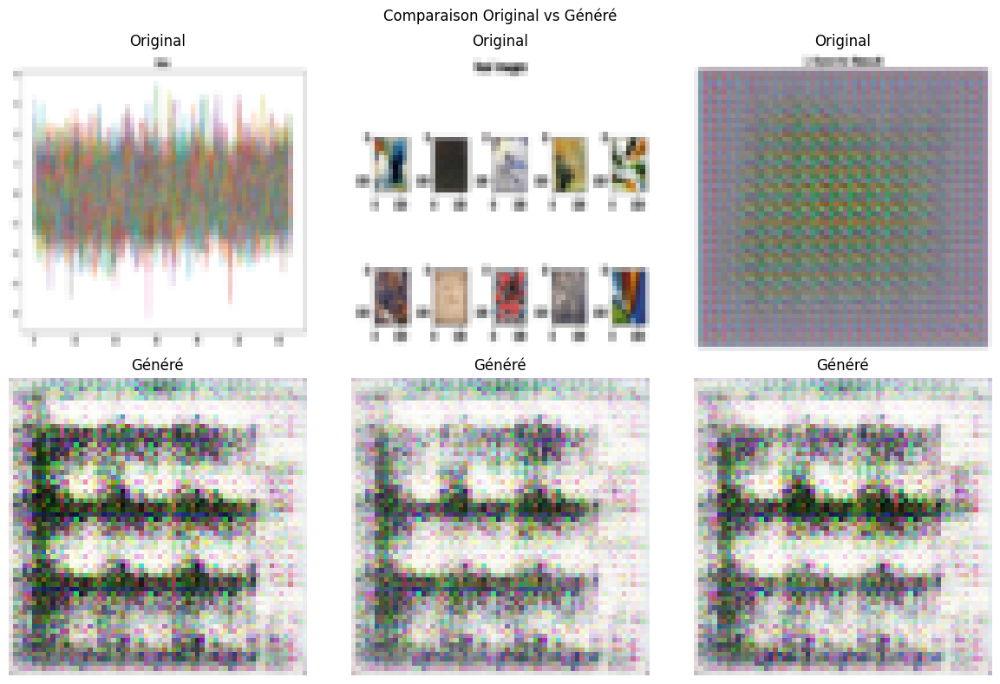

In [58]:
# Fonction denormalize (inchangée)
def denormalize(imgs):
    return (imgs * 0.5 + 0.5).clamp(0, 1)

# Générer 8 images (ou moins si latent_dim mal défini, mais OK)
n_compare = 8
noise = torch.randn(n_compare, latent_dim, device=device)
generated = generator(noise).detach().cpu()
generated = denormalize(generated)

# Prendre originaux (premier batch) - Debug print
real_batch, _ = next(iter(dataloader))
print(f"Taille batch réel: {real_batch.shape}")  # Debug
n_plot = min(n_compare, real_batch.size(0))  # Adaptation dynamique
print(f"Nombre d'images à plotter: {n_plot}")  # Devrait être 8

real_sample = denormalize(real_batch[:n_plot]).permute(0, 2, 3, 1)  # To HWC pour imshow (B, H, W, C)

# Plot comparaison - Ajuste subplots à n_plot
fig, axs = plt.subplots(2, n_plot, figsize=(4 * n_plot, 8))
if n_plot == 1:  # Cas dégénéré (1 subplot, pas de array)
    axs = axs.reshape(2, 1)  # Force 2D array pour uniformité

for i in range(n_plot):
    # Original
    axs[0, i].imshow(real_sample[i])
    axs[0, i].set_title('Original')
    axs[0, i].axis('off')
    
    # Généré
    axs[1, i].imshow(generated[i].permute(1, 2, 0))  # CHW to HWC
    axs[1, i].set_title('Généré')
    axs[1, i].axis('off')

plt.suptitle('Comparaison Original vs Généré')
plt.tight_layout()
plt.savefig('comparison.png')  # Pour rapport
plt.show()